In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import plotly.express as px

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

In [2]:
df = pd.read_csv(r"C:\Users\Ahmed Ashraf\Downloads\Internship_Project\all_atms_processed.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4370 entries, 0 to 4369
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Id           4370 non-null   object 
 1   Governate    4370 non-null   object 
 2   Area Name    4370 non-null   object 
 3   ATM Name     4370 non-null   object 
 4   Latitude     4370 non-null   float64
 5   Longitude    4370 non-null   float64
 6   Description  4370 non-null   object 
dtypes: float64(2), object(5)
memory usage: 239.1+ KB


In [3]:
df[["Latitude", "Longitude"]].describe().T

,count,mean,std,min,25%,50%,75%,max
Latitude,4370.0,29.630102,1.726210,22.337664,29.878274,30.074058,30.729427,31.584344
Longitude,4370.0,31.405974,0.949122,27.234694,31.016466,31.280091,31.561035,35.591817


In [4]:
X = df[["Latitude", "Longitude"]]
X.head(3)

,Latitude,Longitude
0,30.912211,30.170589
1,30.910789,30.177019
2,30.814059,29.988302


In [5]:
X = X.to_numpy()
X

array([[30.912211  , 30.170589  ],
       [30.91078908, 30.17701905],
       [30.81405902, 29.98830245],
       ...,
       [29.975812  , 32.546986  ],
       [29.970363  , 32.551087  ],
       [29.966488  , 32.547425  ]])

**Finding the Appropriate # of Clusters for Kmeans Model:**

In [6]:
num_clusters = [i for i in range(200, 401)]

In [7]:
def kmeans_sil(num_clusters, x_vals):
    sil_score = []
    for num in num_clusters:
        kms = KMeans(n_clusters= num, random_state= 42, n_init= 10)
        kms.fit(x_vals)
        sil_score.append(silhouette_score(x_vals, kms.labels_))

    return sil_score

In [8]:
kmeans_sil_score = kmeans_sil(num_clusters, X)
kmeans_sil_score[:5]

[0.5725993743567926,
 0.5659634803913999,
 0.5770472048512862,
 0.570591243307612,
 0.5681259053970367]

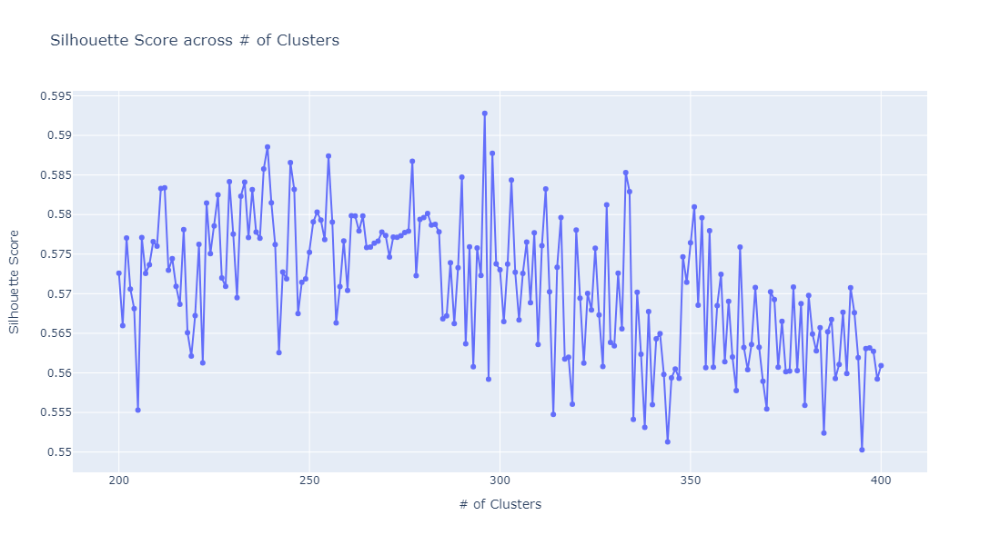

In [9]:
fig = px.line(x= num_clusters, y= kmeans_sil_score, labels= {"x": "# of Clusters", "y": "Silhouette Score"}, 
              title= "Silhouette Score across # of Clusters", markers= True, height= 600)
fig.show()

In [10]:
print("Maximum Silhouette Score: ", round(np.max(kmeans_sil_score), 4))
print("Position of The Maximum Silhouette Score", np.argmax(kmeans_sil_score))

Maximum Silhouette Score:  0.5928
Position of The Maximum Silhouette Score 96


**Building K-Means Model of "296" Clusters:**

In [11]:
kmeans296 = KMeans(n_clusters= 296, random_state= 42, n_init= 10)
kmeans296.fit(X)

KMeans(n_clusters=296, n_init=10, random_state=42)

In [12]:
print(kmeans296.labels_[:10])
print("Unique Labels:", np.unique(kmeans296.labels_))

[ 60  60 226  60  60  60  60  60  60  60]
Unique Labels: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 23

In [13]:
df["Cluster"] = kmeans296.labels_
df.head(3)

,Id,Governate,Area Name,ATM Name,Latitude,Longitude,Description,Cluster
0,a2ecf0ba-d4c5-46ab-b013-1090b84d6d98,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.912211,30.170589,Withdrawal,60
1,ccc384e5-1685-4e11-8714-0ebb44713258,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.910789,30.177019,Withdrawal - Deposit - Currency Exchange,60
2,dd5110e3-dec0-478b-8749-f7f63515d1b3,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.814059,29.988302,Withdrawal - Deposit - Currency Exchange,226


In [14]:
df["Cluster"] = df["Cluster"].astype("object")

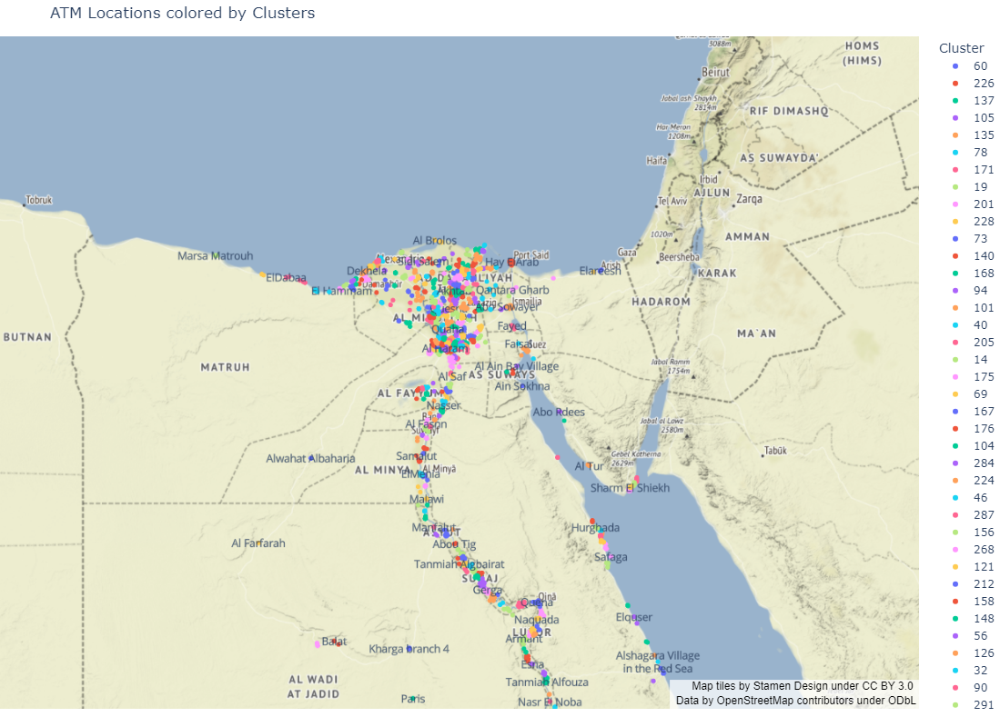

In [15]:
# Create a scattermapbox figure
fig = px.scatter_mapbox(
    df,
    lat= "Latitude",
    lon= "Longitude",
    text= "ATM Name",
    hover_name= "ATM Name",
    hover_data= ["Latitude", "Longitude"],
    title= "ATM Locations colored by Clusters",
    zoom= 10,  # Adjust the initial zoom level
    color= "Cluster")

# Customize the map layout
fig.update_layout(
    mapbox_style= "stamen-terrain",  # You can choose other map styles
    mapbox_zoom= 5.5,  # Adjust the initial zoom level
    mapbox_center= {"lat": df["Latitude"].mean(), "lon": df["Longitude"].mean()})

# figure size
fig.update_layout(height=800, margin={"r": 0, "t": 40, "l": 0, "b": 20}) 

# Show the map
fig.show()

**Finding the Appropriate # of Clusters for Agglomerative Model:**

In [16]:
num_clusters = [i for i in range(200, 401)]

In [17]:
def agglomerative_sil(num_clusters, x_vals):
    sil_score = []
    for num in num_clusters:
        agg = AgglomerativeClustering(n_clusters= num)
        agg.fit(x_vals)
        sil_score.append(silhouette_score(x_vals, agg.labels_))

    return sil_score

In [18]:
agglomerative_sil_score = agglomerative_sil(num_clusters, X)
agglomerative_sil_score[:5]

[0.5732403307439211,
 0.572538667373503,
 0.573492794796654,
 0.5735901247630464,
 0.5743585228953098]

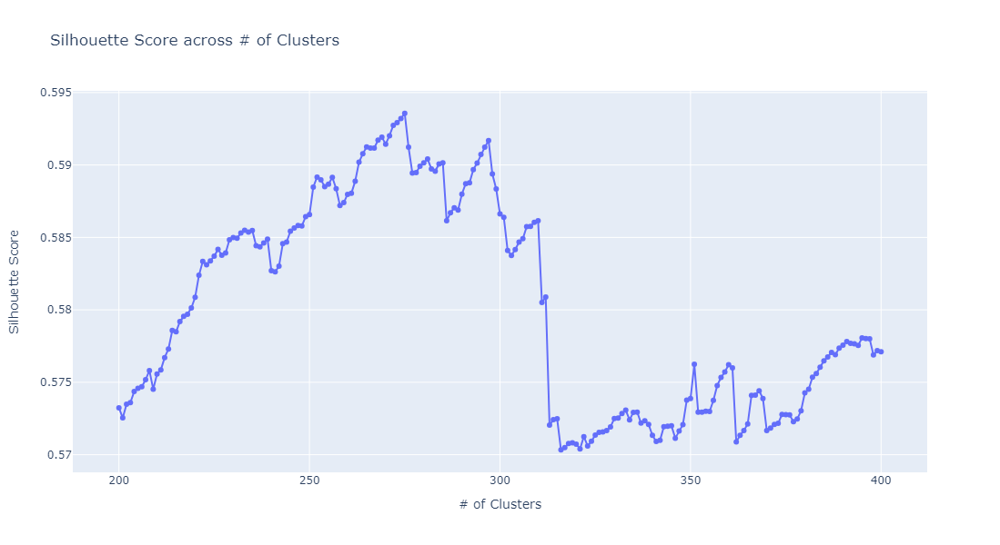

In [19]:
fig = px.line(x= num_clusters, y= agglomerative_sil_score, labels= {"x": "# of Clusters", "y": "Silhouette Score"}, 
              title= "Silhouette Score across # of Clusters", markers= True, height= 600)
fig.show()

In [20]:
print("Maximum Silhouette Score: ", round(np.max(agglomerative_sil_score), 4))
print("Position of The Maximum Silhouette Score", np.argmax(agglomerative_sil_score))

Maximum Silhouette Score:  0.5936
Position of The Maximum Silhouette Score 75


**Building Agglomerative Model of "275" Clusters:**

In [21]:
agglomerative275 = AgglomerativeClustering(n_clusters= 275)
agglomerative275.fit(X)

AgglomerativeClustering(n_clusters=275)

In [22]:
print(agglomerative275.labels_[:10])
print("Unique Labels:", np.unique(agglomerative275.labels_))

[146 146  73 146 146 146 146 146 146 146]
Unique Labels: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 23

In [23]:
df["Cluster"] = agglomerative275.labels_
df.head(3)

,Id,Governate,Area Name,ATM Name,Latitude,Longitude,Description,Cluster
0,a2ecf0ba-d4c5-46ab-b013-1090b84d6d98,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.912211,30.170589,Withdrawal,146
1,ccc384e5-1685-4e11-8714-0ebb44713258,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.910789,30.177019,Withdrawal - Deposit - Currency Exchange,146
2,dd5110e3-dec0-478b-8749-f7f63515d1b3,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.814059,29.988302,Withdrawal - Deposit - Currency Exchange,73


In [24]:
df["Cluster"] = df["Cluster"].astype("object")

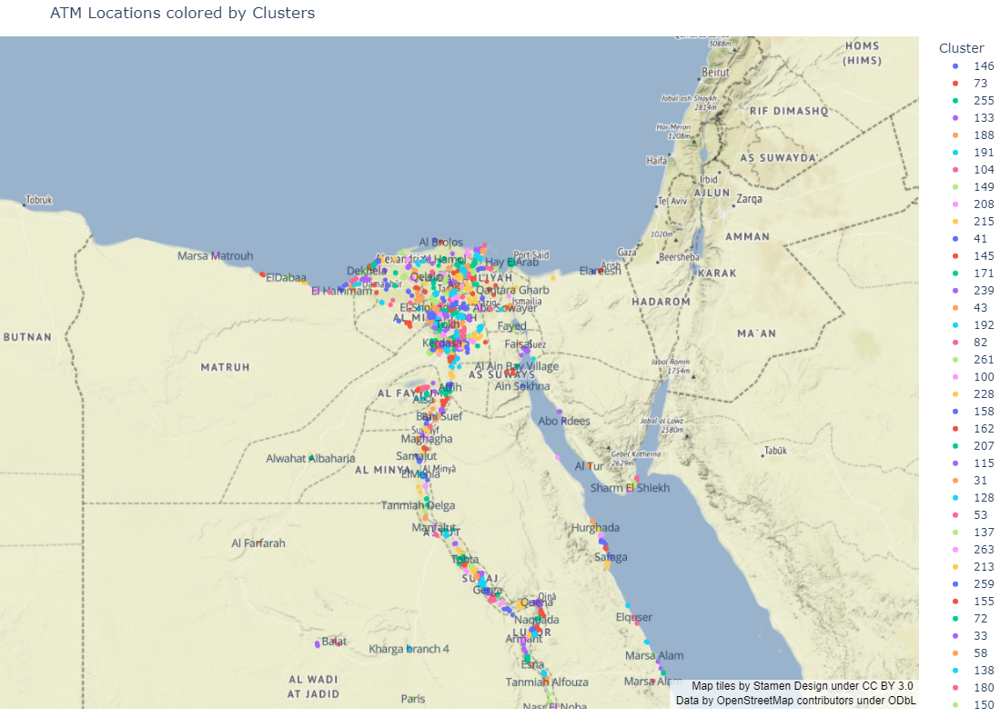

In [25]:
# Create a scattermapbox figure
fig = px.scatter_mapbox(
    df,
    lat= "Latitude",
    lon= "Longitude",
    text= "ATM Name",
    hover_name= "ATM Name",
    hover_data= ["Latitude", "Longitude"],
    title= "ATM Locations colored by Clusters",
    zoom= 10,  # Adjust the initial zoom level
    color= "Cluster")

# Customize the map layout
fig.update_layout(
    mapbox_style= "stamen-terrain",  # You can choose other map styles
    mapbox_zoom= 5.5,  # Adjust the initial zoom level
    mapbox_center= {"lat": df["Latitude"].mean(), "lon": df["Longitude"].mean()})

# figure size
fig.update_layout(height=800, margin={"r": 0, "t": 40, "l": 0, "b": 20}) 

# Show the map
fig.show()

**Building Agglomerative Model without Specific # of Clusters:**

In [26]:
agglomerative = AgglomerativeClustering(n_clusters= None, distance_threshold= 0.1, compute_distances= True)
agglomerative.fit(X)

AgglomerativeClustering(compute_distances=True, distance_threshold=0.1,
                        n_clusters=None)

In [27]:
print(agglomerative.labels_[:10])
print("Unique Labels:", np.unique(agglomerative.labels_))

[ 88  88 391  88  88  88  88  88  88  88]
Unique Labels: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 23

In [28]:
print("Silhouette Score =", silhouette_score(X, agglomerative.labels_))

Silhouette Score = 0.5768081734106608


In [29]:
df["Cluster"] = agglomerative.labels_
df.head(3)

,Id,Governate,Area Name,ATM Name,Latitude,Longitude,Description,Cluster
0,a2ecf0ba-d4c5-46ab-b013-1090b84d6d98,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.912211,30.170589,Withdrawal,88
1,ccc384e5-1685-4e11-8714-0ebb44713258,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.910789,30.177019,Withdrawal - Deposit - Currency Exchange,88
2,dd5110e3-dec0-478b-8749-f7f63515d1b3,Al-Behera,Abu Al Matamir,Abu Al Matamir,30.814059,29.988302,Withdrawal - Deposit - Currency Exchange,391


In [30]:
df["Cluster"] = df["Cluster"].astype("object")

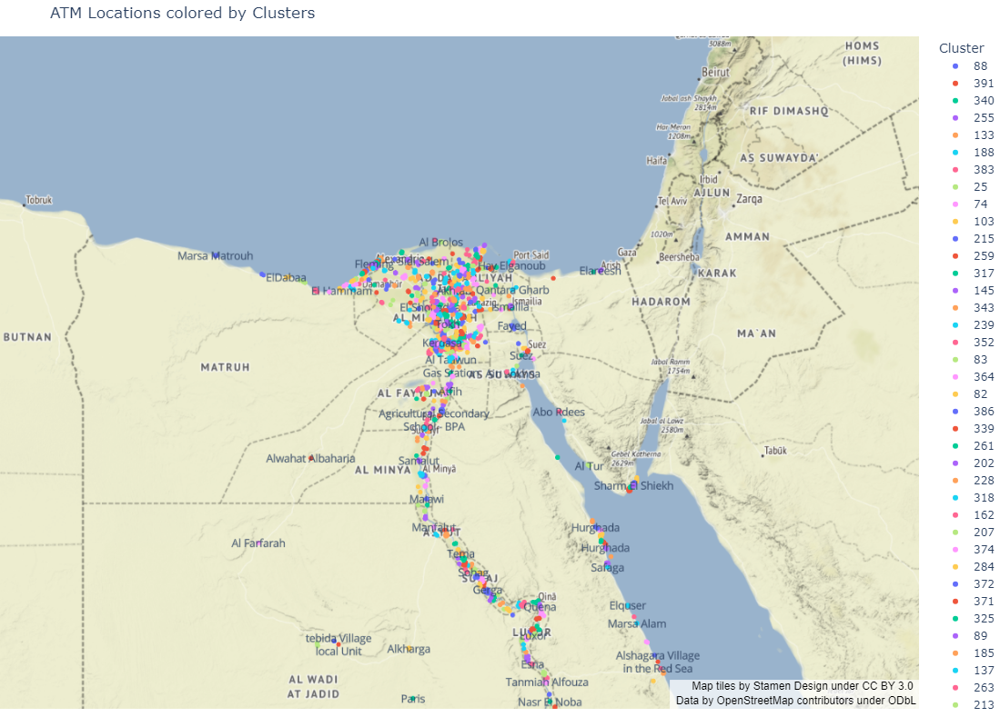

In [31]:
# Create a scattermapbox figure
fig = px.scatter_mapbox(
    df,
    lat= "Latitude",
    lon= "Longitude",
    text= "ATM Name",
    hover_name= "ATM Name",
    hover_data= ["Latitude", "Longitude"],
    title= "ATM Locations colored by Clusters",
    zoom= 10,  # Adjust the initial zoom level
    color= "Cluster")

# Customize the map layout
fig.update_layout(
    mapbox_style= "stamen-terrain",  # You can choose other map styles
    mapbox_zoom= 5.5,  # Adjust the initial zoom level
    mapbox_center= {"lat": df["Latitude"].mean(), "lon": df["Longitude"].mean()})

# figure size
fig.update_layout(height=800, margin={"r": 0, "t": 40, "l": 0, "b": 20}) 

# Show the map
fig.show()